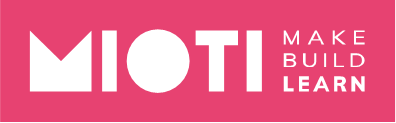
<br/>
<center style="color:#888">Master Deep Learning<br/>Asignatura Computer Vision</center>
<center style="color:#aaa; margin-top:10px;">Prof. Óscar Picazo Montoya<br>oscarpm@faculty.mioti.es</center>


# Challenge S4: Reconocimiento de matrículas

## Objetivos

El objetivo de este challenge es implementar una aplicación de video vigilancia capaz de reconocer las matrículas de los vehículos que aparecen en una secuencia de vídeo.

Piensa que las matrículas son un identificador único de los vehículos por lo que ser capaz de reconocerlas es un pilar básico en cualquier aplicación de análisis del tráfico y aplicaciones del ámbito de Smart Cities.

## Configuración del entorno

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data, io, filters, transform
from skimage.filters import threshold_otsu
from skimage.color import rgb2gray
from skimage.measure import label
from skimage.util import invert
from skimage.measure import regionprops
from ipywidgets import interactive, IntSlider, FloatSlider

import warnings
warnings.filterwarnings("ignore")

Esta vez vamos a cargar unas cuantas funciones auxiliares, las puedes ver en el fichero `ocr.py`.

In [2]:
from ocr import mostrar_blobs, mostrar_rois, mostrar_frames
from ocr import extraer_limites, genera_dataset, carga_dataset, extraer_ventana, dibujar_matches

### Dataset 

En este caso vamos a utilizar algunas imágenes de un dataset de la Universidad de Zagreb (http://www.zemris.fer.hr/projects/LicensePlates/english/results.shtml) las imágenes se encuentran en la carpeta `dataset`.

El primer paso que vamos a hacer es cargarlas:

In [3]:
dataset_rgb = io.ImageCollection('dataset/*.jpg')
print("Cargadas {} instancias.".format(len(dataset_rgb)))

Cargadas 8 instancias.


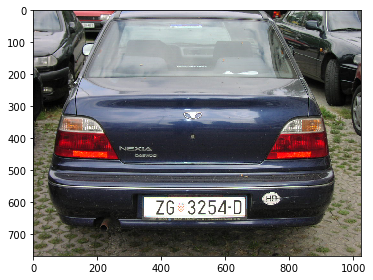

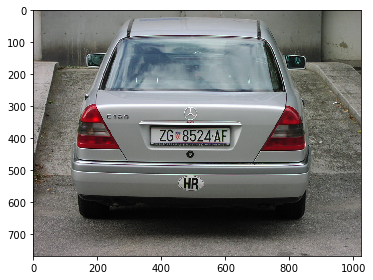

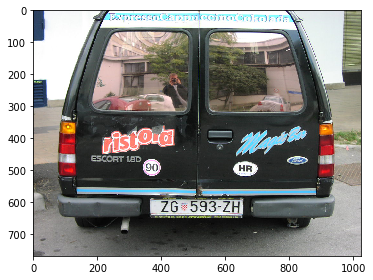

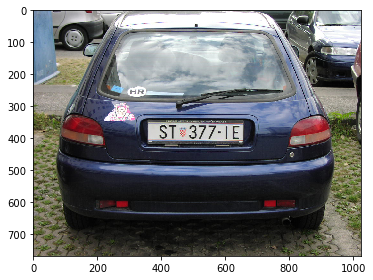

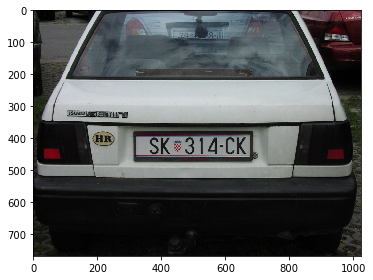

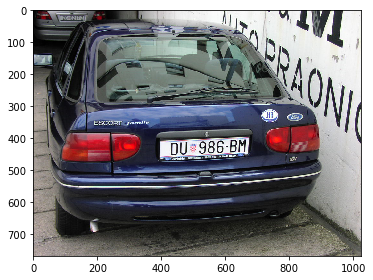

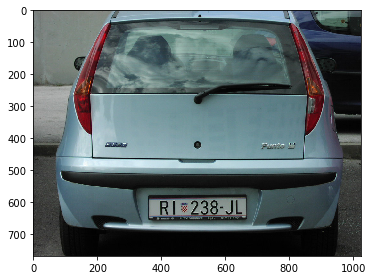

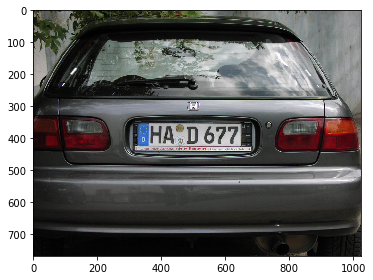

In [4]:
mostrar_frames(dataset_rgb)

### Conversión a gris

El siguiente paso es convertir las imágenes de su espacio de color original RGB en escala de grises:

In [5]:
def convierte_a_gris_frames(imgs):
    """Función que recibe una lista de frames y que devuelve otra lista de frames convertidos en gris."""
    out = []
    
    # Recorre cada frame, conviértelo a gris y guardalo en la lista out.
    out=[rgb2gray(img) for img in imgs]

    return out

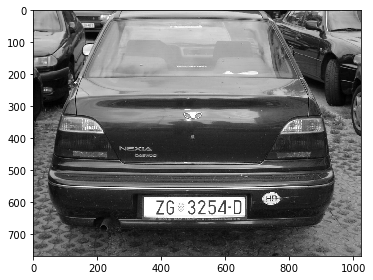

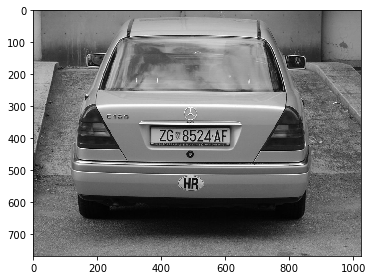

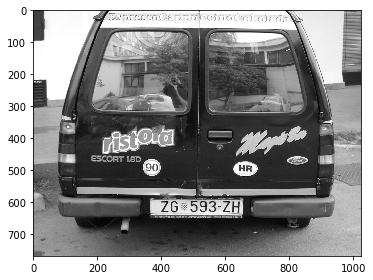

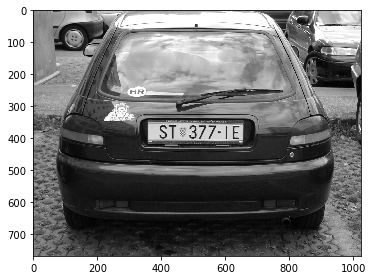

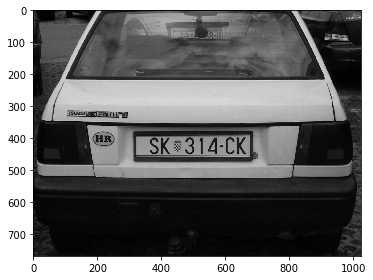

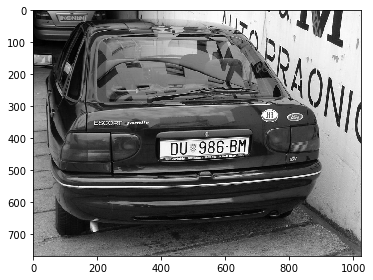

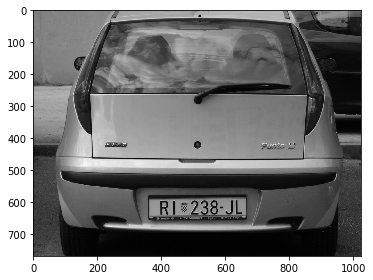

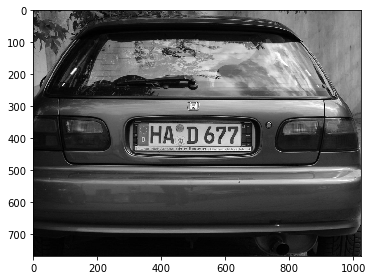

In [6]:
dataset_gris = convierte_a_gris_frames(dataset_rgb)
mostrar_frames(dataset_gris)

### Binarización

Una vez convertidas las imagenes a escala de grises vamos a binarizarlas:

In [7]:
from skimage.filters import threshold_otsu


def binariza_frames(imgs):
    """Función que recibe una lista de frames en escala de grises y los convierte a monocromo."""
    out = []
   
    # Recorre cada frame y binarizalo. Guárdalo en la lista out.
    out=[img > threshold_otsu(img) for img in imgs]

    return out

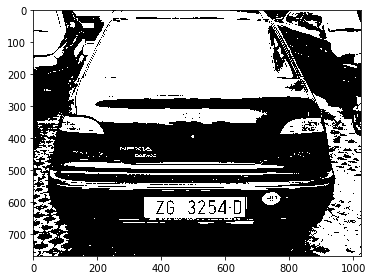

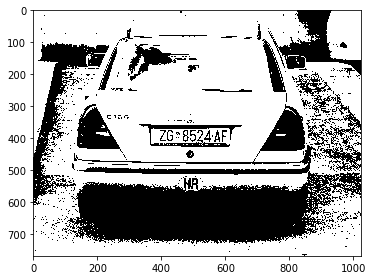

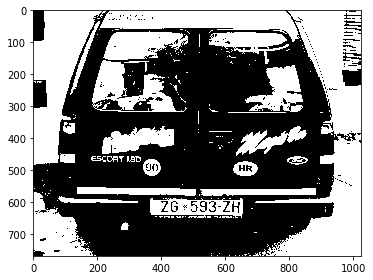

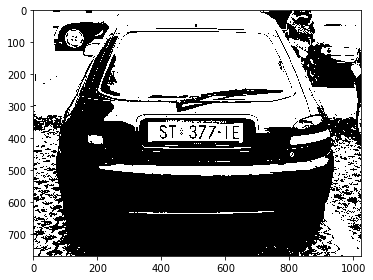

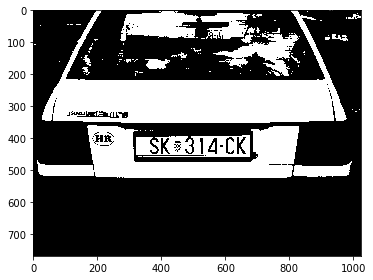

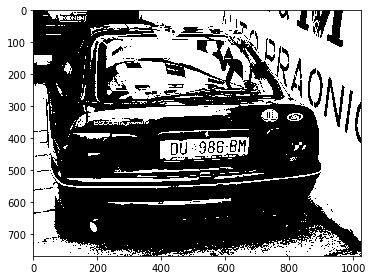

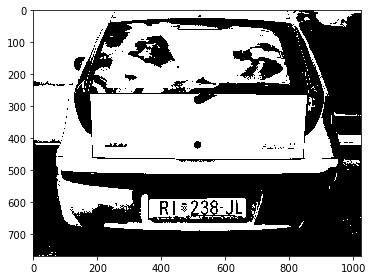

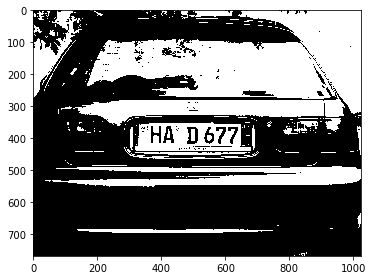

In [8]:
dataset_mono = binariza_frames(dataset_gris)
mostrar_frames(dataset_mono)

### Segmentación

Una vez binarizadas estamos en condiciones de realizar la segmentación (identificación de caracteres):

In [9]:
from skimage.measure import label
from skimage.util import invert

def extraccion_de_rois(imgs, debug=False):
    """Recibe una lista de imagenes en monocromo y devuelve una lista de regiones de interes"""
    """adicionalmente si debug es True muestra por cada imagen los rois extraidos"""
    out = []
    
    # Recorre cada imagen y extrae los rois, si debug=True muestrálos con mostrar_rois

    
    for img in imgs:
        img_labeled = label(invert(img))
        rois = regionprops(img_labeled)
        if debug:
            mostrar_rois(img,rois)
        out.append(rois)
        
    return out

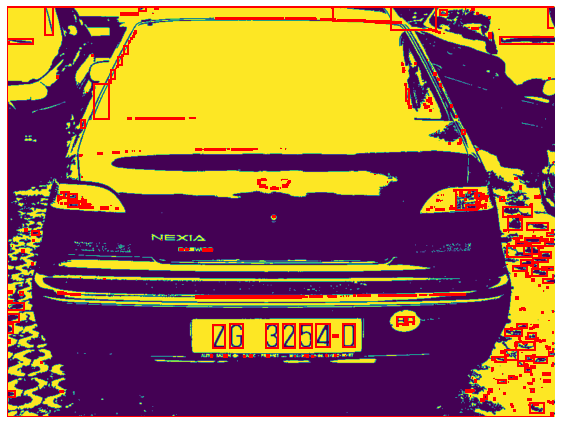

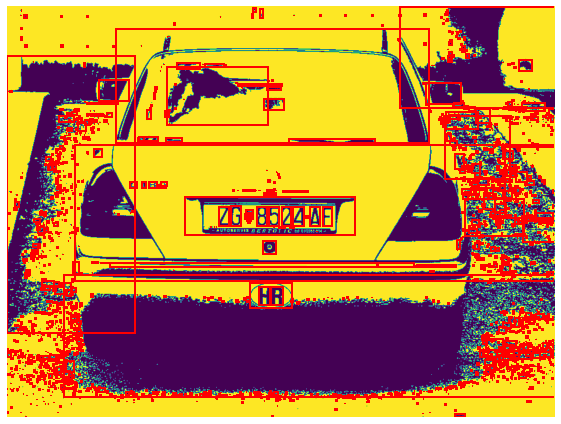

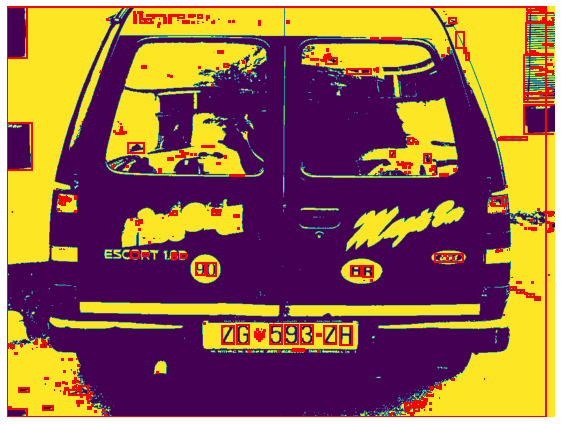

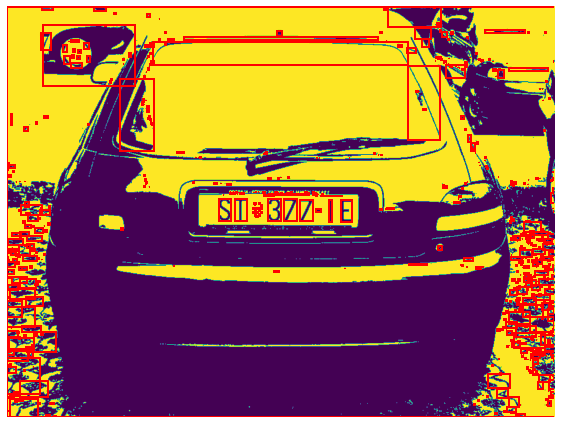

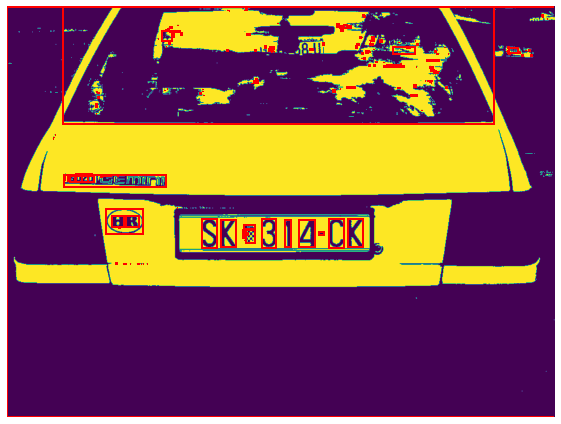

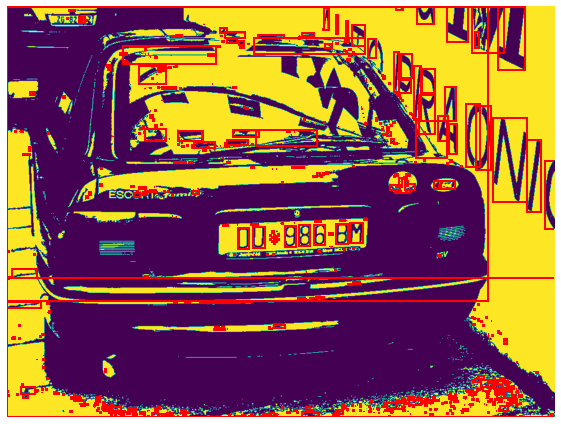

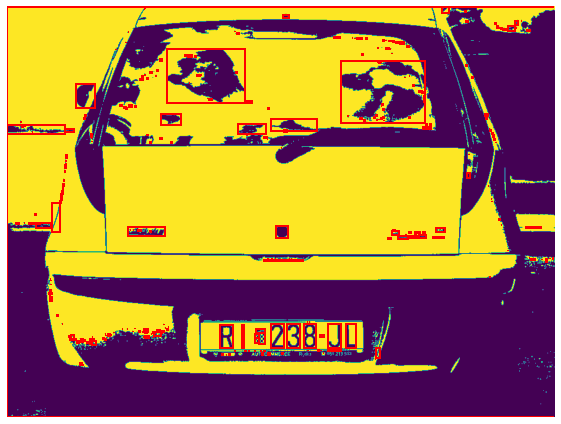

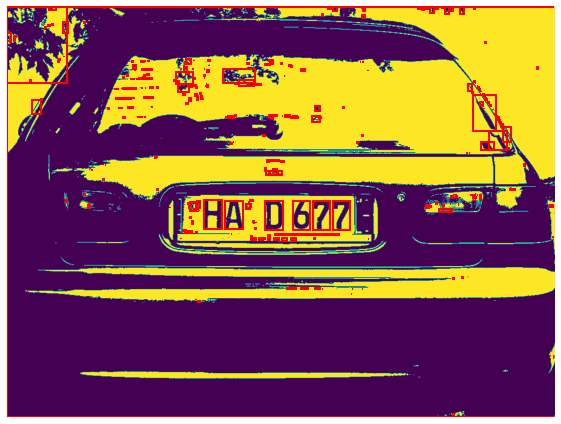

In [10]:
dataset_rois = extraccion_de_rois(dataset_mono, debug=True)

### Filtrado de rois

Como puedes ver en los resultados de los rois hay muchos falsos positivos. Filtra los mismos de manera que minimize los falsos rois manteniendo los verdaderos. 

Apoyate en la función `filtrar_rois` que filtra los rois que estén fuera de un área minima y área máxima.

In [11]:
def filtrar_rois(rois, area_min=200, area_max = 400):
    rois_filtered = []
    for roi in rois:
        if roi.area >= area_min and roi.area <= area_max:
            rois_filtered.append(roi)
            
    return rois_filtered

In [12]:
def limpiar_rois(dataset_rois, imgs, debug=True):
    """Función que recibe una lista con los rois de cada frame junto a una lista de frames"""
    """Si debug es True adicionalmente se muestran los rois sobreimpresos en la imagen usando mostrar_rois"""
    out = []
   
    # Recorre cada grupo de rois y filtralo. Guardarlo en out y si debug=True muéstralos.
    for i in range(len(imgs)):
        rois_filtered=filtrar_rois(dataset_rois[i], area_min=150,area_max=1250)
        if debug:
            mostrar_rois(imgs[i],rois_filtered)
        out.append(rois_filtered)
    return out

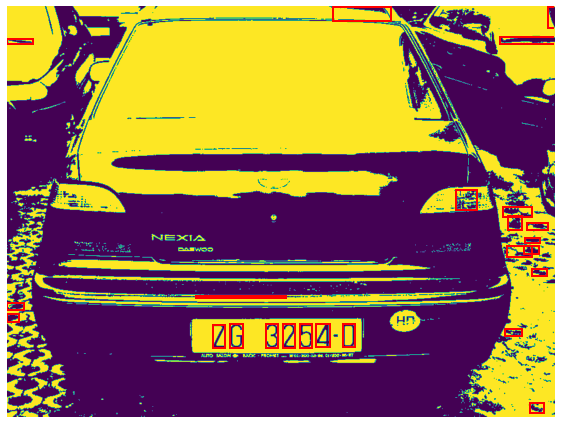

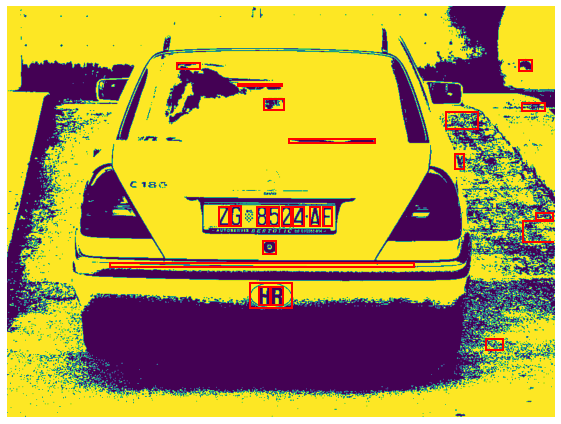

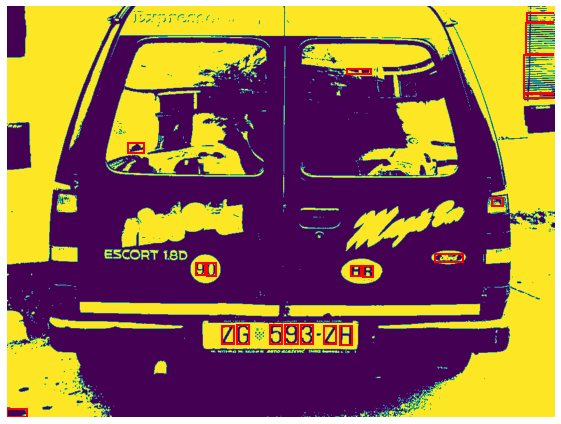

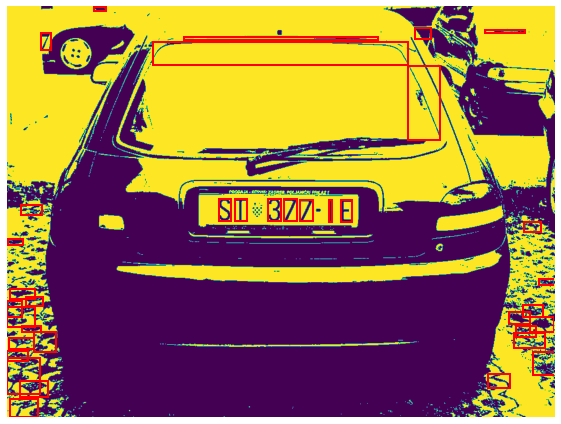

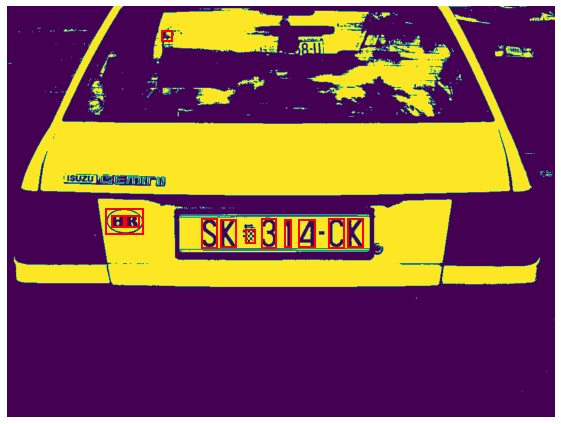

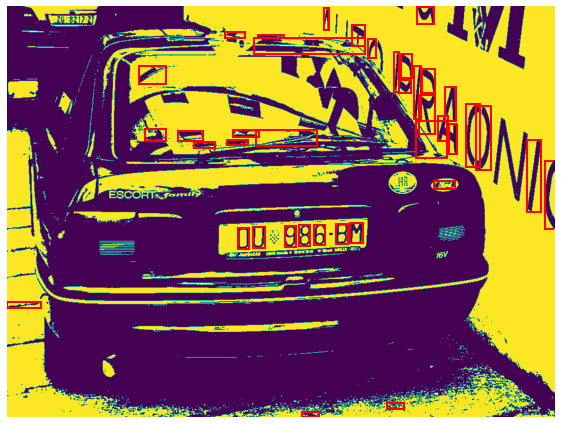

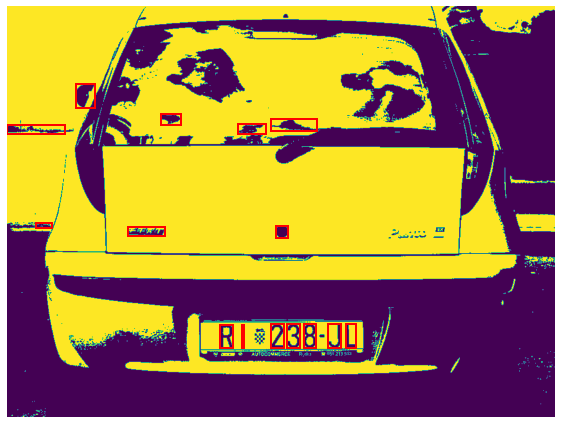

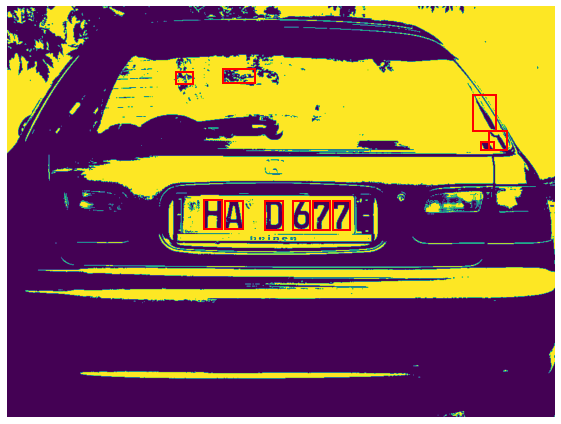

In [13]:
dataset_rois_filtered = limpiar_rois(dataset_rois, dataset_mono, debug=True)

### Entrenamiento del modelo

Una vez segmentada la imagen vamos a clasificar los rois obtenidos para ello vamos a generar un dataset y cargarlo:

In [14]:
genera_dataset("corpus", fonts_folder="fonts") # Puedes ver el código de esta función en ocr.py

In [15]:
X, y, clases = carga_dataset("corpus") # Puedes ver el código de esta función en ocr.py

{54: '0', 55: '1', 56: '2', 57: '3', 58: '4', 59: '5', 60: '6', 61: '7', 62: '8', 63: '9', 27: 'A', 28: 'B', 29: 'C', 30: 'D', 31: 'E', 32: 'F', 33: 'G', 34: 'H', 35: 'I', 36: 'J', 37: 'K', 38: 'L', 39: 'M', 40: 'N', 42: 'O', 43: 'P', 44: 'Q', 45: 'R', 46: 'S', 47: 'T', 48: 'U', 49: 'V', 50: 'W', 51: 'X', 52: 'Y', 53: 'Z', 0: 'a', 1: 'b', 2: 'c', 3: 'd', 4: 'e', 5: 'f', 6: 'g', 7: 'h', 8: 'i', 9: 'j', 10: 'k', 11: 'l', 12: 'm', 13: 'n', 15: 'o', 16: 'p', 17: 'q', 18: 'r', 19: 's', 20: 't', 21: 'u', 22: 'v', 23: 'w', 24: 'x', 25: 'y', 26: 'z', 41: 'Ñ', 14: 'ñ'}
Cargadas 4800 instancias con 256 atributos. Clases 64.


Entrena el modelo con el dataset proporcionado y evalúa su score.

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=.3,random_state=42)

In [17]:
# utilizamos MLPCClassifier u otro

from sklearn.neural_network import MLPClassifier
nn=MLPClassifier(random_state=42)
nn.fit(X_train, y_train)

MLPClassifier(random_state=42)

In [18]:
nn.score(X_test, y_test)

0.8972222222222223

In [19]:
# from sklearn.svm import SVC
# nn=SVC(random_state=42)
# nn.fit(X_train, y_train)

In [20]:
# nn.score(X_test, y_test)/

### Evaluación

Por último evalúa los rois obtenidos con el modelo entrenado, apoyate en la función `reconoce_roi` que reconoce un roi concreto:

In [21]:
def reconoce_roi(img, roi, model, clases, debug=False):
    """Reconoce una región de interés, devuelve el indice de clase y la letra real"""
    top, left, bottom, right = roi.bbox

    # def extraer_ventana(img, x, y, width, height):
    ventana = extraer_ventana(img, left, top, right - left, bottom - top)
    
    if debug:
        print("Original:")
        io.imshow(ventana)
        io.show()
    
#     ventana_scaled = transform.resize(ventana, (8, 8))
    ventana_scaled = transform.resize(ventana, (16,16))
    
    if debug:
        print("Preprocesada:")
        io.imshow(ventana_scaled)
        io.show()
    
    y_predicted_filtered = int(model.predict(ventana_scaled.reshape(1, 256)))
    letra = clases[y_predicted_filtered]
    
    if debug:
        print("Clase predicha: {}\n\n".format(letra))
        
    return letra, y_predicted_filtered

In [22]:
def reconoce_imgs(imgs_gris, imgs_rgb, dataset_rois):
    """Recibe una lista de imágenes en gris, los mismos en rgb y sus correspondientes rois y los clasifica"""
    """y muestra los resultados."""
    
    # Recorre cada imagen y sus rois y reconocelos, metelos en una lista y muestralos con la función
    # dibujar_matches
    for i in range(len(imgs_gris)):
        rois_filtered=filtrar_rois(dataset_rois[i], area_min=450,area_max=1250)
        matches=[]
        for roi in dataset_rois[i]:
            letra, class_index = reconoce_roi(imgs_gris[i],roi,nn,clases,False)
            matches.append((roi,letra))
            
        dibujar_matches(imgs_rgb[i],matches,show_original_img=True)
        
    return matches
    

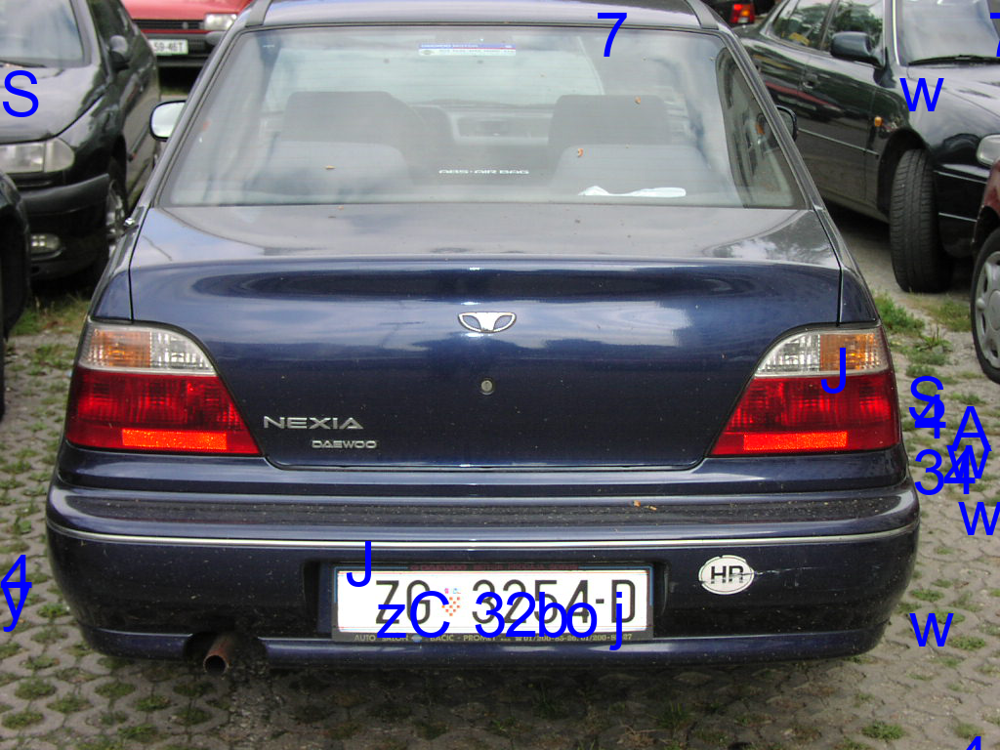

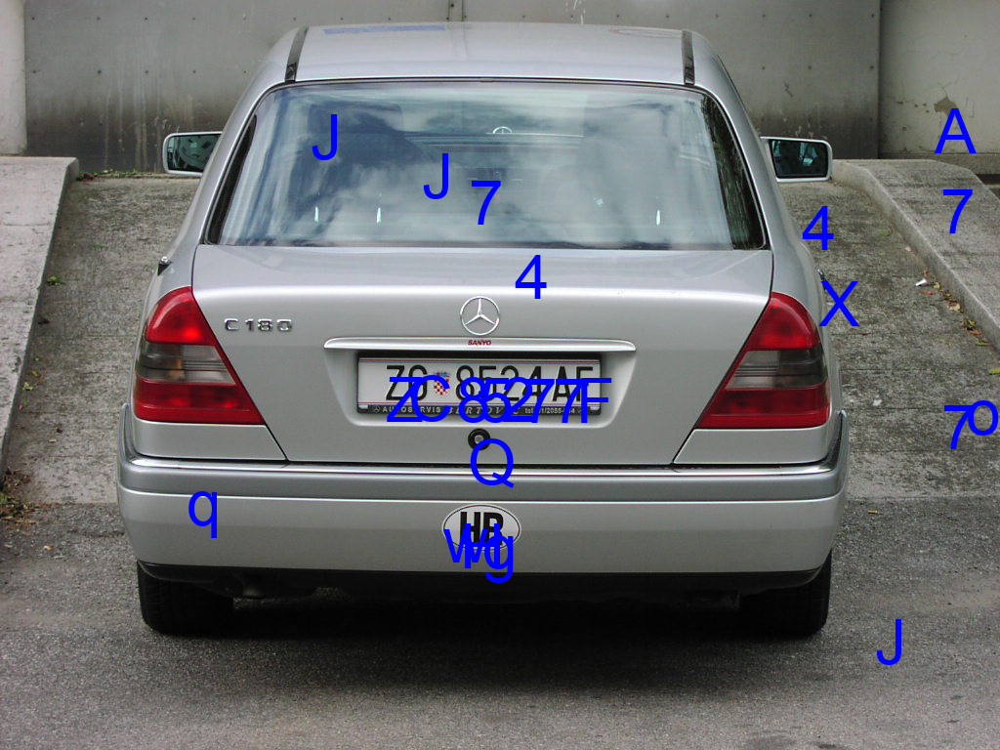

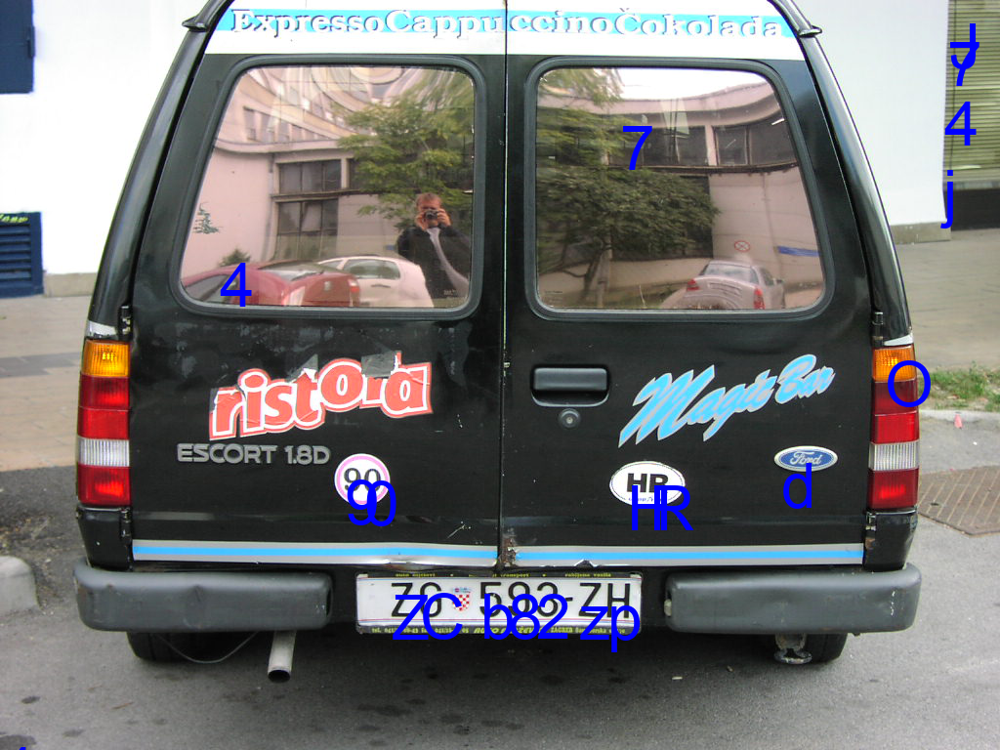

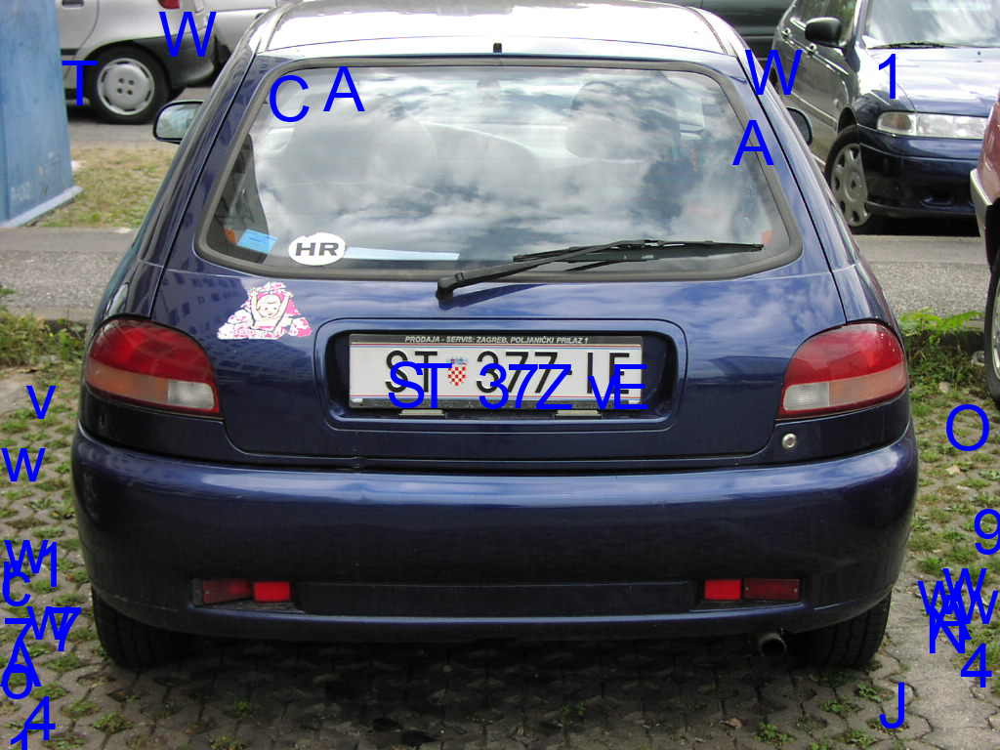

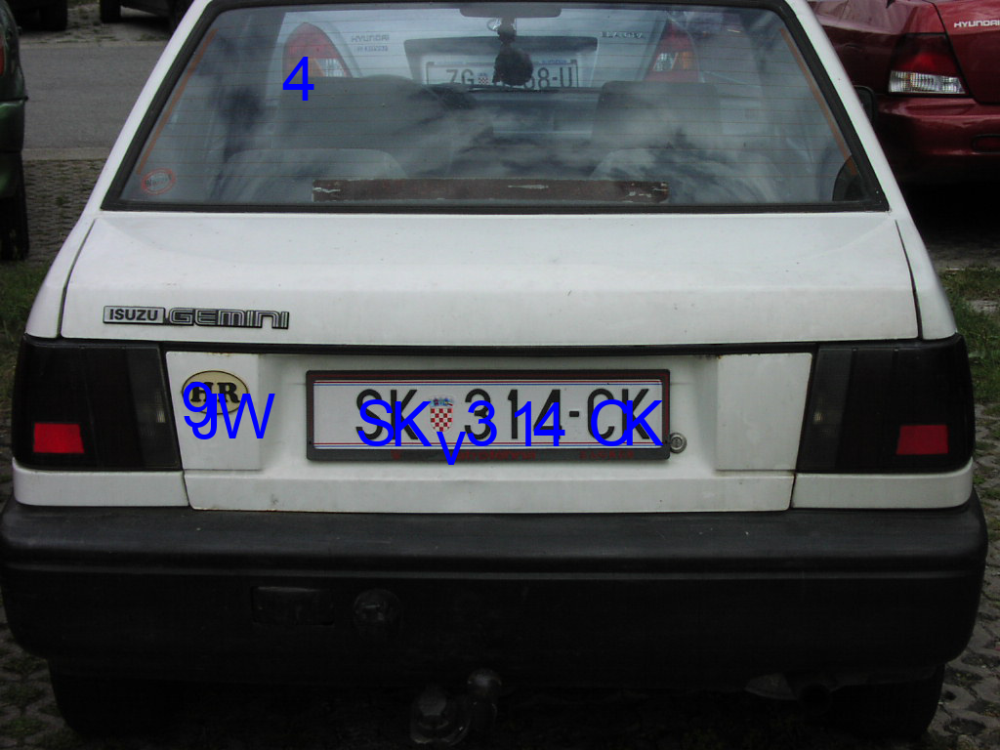

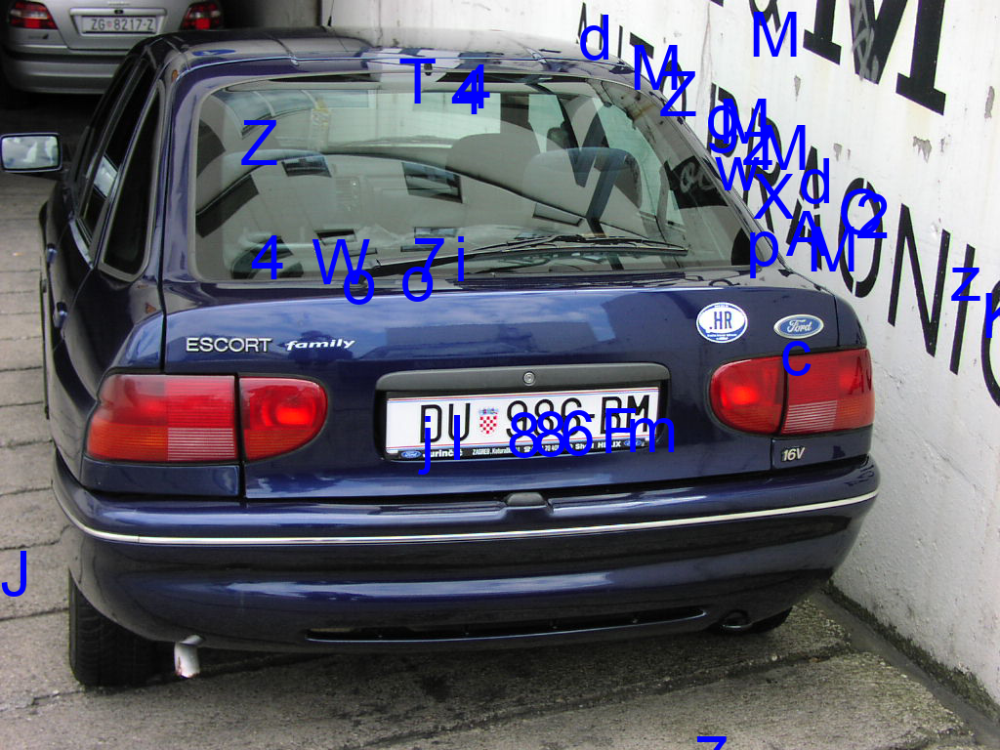

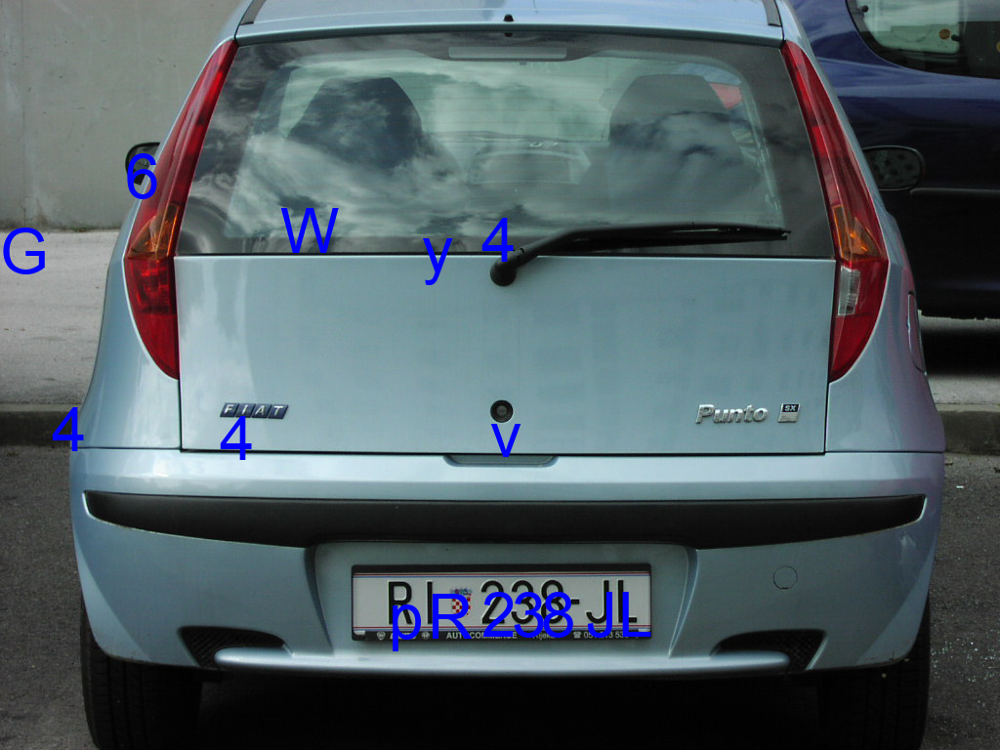

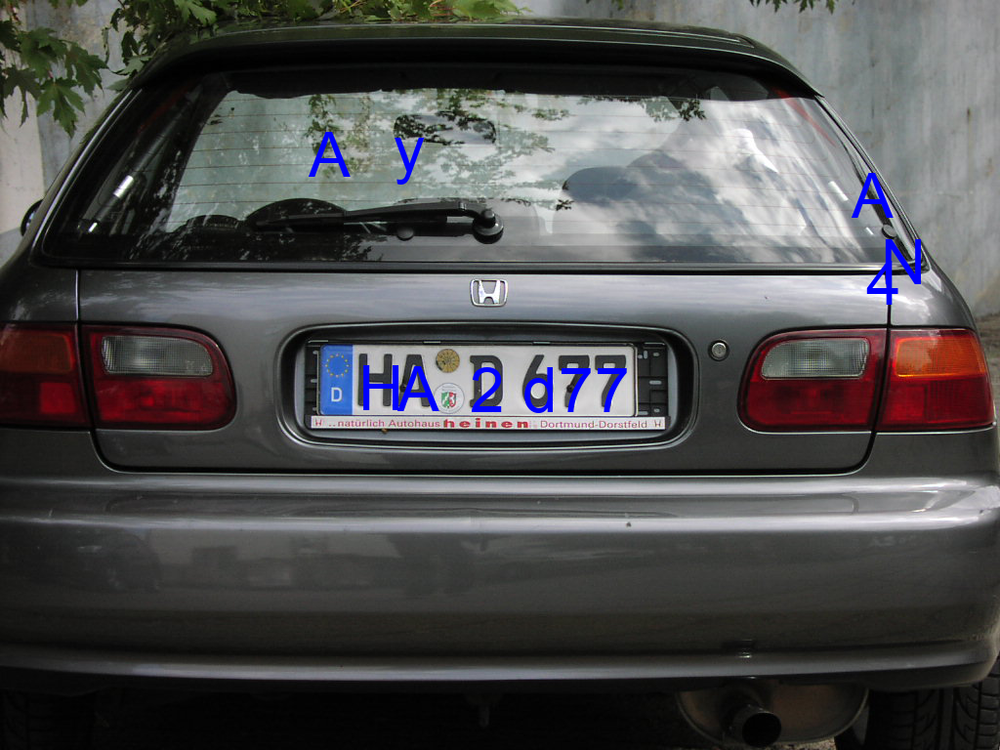

[(<skimage.measure._regionprops.RegionProperties at 0x2488e1d2100>, 'y'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e1cf820>, 'A'),
 (<skimage.measure._regionprops.RegionProperties at 0x2489102aa00>, 'A'),
 (<skimage.measure._regionprops.RegionProperties at 0x24891012520>, 'N'),
 (<skimage.measure._regionprops.RegionProperties at 0x248910126d0>, '4'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e8ba250>, 'H'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e8ba2e0>, 'A'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e8ba370>, '2'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e8ba3a0>, 'd'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e8ba3d0>, '7'),
 (<skimage.measure._regionprops.RegionProperties at 0x2488e8ba400>, '7')]

In [23]:
reconoce_imgs(dataset_gris, dataset_rgb, dataset_rois_filtered)

### Conclusiones

* ¿ Cómo mejorarías el algoritmo?

Problemas -> Resoluciones si se tienen
Dtectamos rois donde ya no deberiamos.